<div class="alert alert-block alert-info">
    <p><img src="https://geekbrains.ru/apple-touch-icon-57x57.png" align="right" alt="GeekBrains"></p>
    <p style="color:DarkSlateGray"><b>Course:</b> Machine Learning Systems in Production</p>
    <p style="color:DarkSlateGray"><b>Project:</b> Churn Prediction in Game Project</p>
    <p style="color:DarkSlateGray"><b>Supervisor:</b> Fedor Erin</p>
    <p style="color:DarkSlateGray"><b>Author:</b> Dmitry Doni</p>
</div>

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from imblearn.over_sampling import SMOTE, ADASYN

from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.feature_selection import chi2, mutual_info_classif, RFECV
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, roc_curve, auc, \
                            log_loss, roc_auc_score, average_precision_score, confusion_matrix
from scipy import interp
from mpl_toolkits.axes_grid1 import make_axes_locatable
import xgboost as xgb

import time
from datetime import datetime, timedelta

from collections import Counter

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Display charts in Jupyter Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
# Display inline plots as SVG
%config InlineBackend.figure_formats = ['svg']
# Set the limit of columns displayed in the notebook
pd.options.display.max_columns = 100

## Data Collection

Data was loaded from Apache Impala (using `dwhimpalautil` for connection). In this project, we are using ready-to-use datasets in CSV format:
* `../../datasets/gamechurn/train/`
* `../../datasets/gamechurn/test/`

## Building Datasets

In [3]:
def time_format(sec):
    return str(timedelta(seconds=sec))

In [4]:
def build_dataset_raw(churned_start_date='2019-01-01', 
                      churned_end_date='2019-02-01', 
                      inter_list=[(1,7),(8,14)],
                      raw_data_path='train/',
                      dataset_path='dataset/', 
                      mode='train'):
    
    start_t = time.time()
 
    sample = pd.read_csv('{}sample.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    profiles = pd.read_csv('{}profiles.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    payments = pd.read_csv('{}payments.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    reports = pd.read_csv('{}reports.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    abusers = pd.read_csv('{}abusers.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    logins = pd.read_csv('{}logins.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    pings = pd.read_csv('{}pings.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    sessions = pd.read_csv('{}sessions.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    shop = pd.read_csv('{}shop.csv'.format(raw_data_path), sep=';', na_values=['\\N', 'None'], encoding='utf-8')
    
    print('Run time (reading csv files): {}'.format(time_format(time.time()-start_t)))    
#-----------------------------------------------------------------------------------------------------    
    print('NO dealing with outliers, missing values and categorical features...')
#-----------------------------------------------------------------------------------------------------        
    # На основании дня отвала (last_login_dt) строим признаки, которые описывают активность игрока перед уходом
    
    print('Creating dataset...')
    # Создадим пустой датасет - в зависимости от режима построения датасета - train или test
    if mode == 'train':
        dataset = sample.copy()[['user_id', 'is_churned', 'level', 'donate_total']]
    elif mode == 'test':
        dataset = sample.copy()[['user_id', 'level', 'donate_total']]

    # Пройдемся по всем источникам, содержащим "динамичекие" данные
    for df in [payments, reports, abusers, logins, pings, sessions, shop]:

        # Получим 'day_num_before_churn' для каждого из значений в источнике для определения недели
        data = pd.merge(sample[['user_id', 'login_last_dt']], df, on='user_id')
        data['day_num_before_churn'] = 1 + (data['login_last_dt'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d')) - 
                                data['log_dt'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d'))).apply(lambda x: x.days)
        df_features = data[['user_id']].drop_duplicates().reset_index(drop=True)

        # Для каждого признака создадим признаки для каждого из времененно интервала (в нашем примере 4 интервала по 7 дней)
        features = list(set(data.columns) - set(['user_id', 'login_last_dt', 'log_dt', 'day_num_before_churn']))
        print('Processing features:', features)
        for feature in features:
            for i, inter in enumerate(inter_list):
                inter_df = data.loc[data['day_num_before_churn'].between(inter[0], inter[1], inclusive=True)].\
                                groupby('user_id')[feature].mean().reset_index().\
                                rename(index=str, columns={feature: feature+'_{}'.format(i+1)})
                df_features = pd.merge(df_features, inter_df, how='left', on='user_id')

        # Добавляем построенные признаки в датасет
        dataset = pd.merge(dataset, df_features, how='left', on='user_id')
        
        print('Run time (calculating features): {}'.format(time_format(time.time()-start_t)))

    # Добавляем "статические" признаки
    dataset = pd.merge(dataset, profiles, on='user_id')
#---------------------------------------------------------------------------------------------------------------------------
    dataset.to_csv('{}dataset_raw_{}.csv'.format(dataset_path, mode), sep=';', index=False)
    print('Dataset is successfully built and saved to {}, run time "build_dataset_raw": {}'.\
          format(dataset_path, time_format(time.time()-start_t)))

In [5]:
# Parameters for building dataset

CHURNED_START_DATE = '2019-09-01' 
CHURNED_END_DATE = '2019-10-01'

INTER_1 = (1,7)
INTER_2 = (8,14)
INTER_3 = (15,21)
INTER_4 = (22,28)
INTER_LIST = [INTER_1, INTER_2, INTER_3, INTER_4]

In [6]:
# Train dataset
build_dataset_raw(churned_start_date=CHURNED_START_DATE,
                  churned_end_date=CHURNED_END_DATE,
                  inter_list=INTER_LIST,
                  raw_data_path='../../datasets/gamechurn/train/',
                  dataset_path='../../datasets/gamechurn/dataset/', 
                  mode='train')

Run time (reading csv files): 0:01:19.172721
NO dealing with outliers, missing values and categorical features...
Creating dataset...
Processing features: ['pay_amt', 'trans_amt']
Run time (calculating features): 0:01:44.962736
Processing features: ['reports_amt']
Run time (calculating features): 0:03:15.369718
Processing features: ['sess_with_abusers_amt']
Run time (calculating features): 0:07:52.732393
Processing features: ['disconnect_amt', 'session_amt']
Run time (calculating features): 0:13:11.611944
Processing features: ['avg_min_ping']
Run time (calculating features): 0:18:13.796782
Processing features: ['kd', 'session_player', 'win_rate', 'leavings_rate']
Run time (calculating features): 0:23:20.614047
Processing features: ['gold_spent', 'silver_spent']
Run time (calculating features): 0:28:42.617139
Dataset is successfully built and saved to ../../datasets/gamechurn/dataset/, run time "build_dataset_raw": 0:29:08.987798


In [7]:
# Test dataset
build_dataset_raw(churned_start_date=CHURNED_START_DATE,
                  churned_end_date=CHURNED_END_DATE,
                  inter_list=INTER_LIST,
                  raw_data_path='../../datasets/gamechurn/test/',
                  dataset_path='../../datasets/gamechurn/dataset/', 
                  mode='test')

Run time (reading csv files): 0:00:05.462021
NO dealing with outliers, missing values and categorical features...
Creating dataset...
Processing features: ['pay_amt', 'trans_amt']
Run time (calculating features): 0:00:07.583933
Processing features: ['reports_amt']
Run time (calculating features): 0:00:15.353734
Processing features: ['sess_with_abusers_amt']
Run time (calculating features): 0:00:38.833609
Processing features: ['disconnect_amt', 'session_amt']
Run time (calculating features): 0:01:06.517375
Processing features: ['avg_min_ping']
Run time (calculating features): 0:01:34.406740
Processing features: ['kd', 'session_player', 'win_rate', 'leavings_rate']
Run time (calculating features): 0:02:02.513966
Processing features: ['gold_spent', 'silver_spent']
Run time (calculating features): 0:02:32.431868
Dataset is successfully built and saved to ../../datasets/gamechurn/dataset/, run time "build_dataset_raw": 0:02:34.852473


In [8]:
train = pd.read_csv('../../datasets/gamechurn/dataset/dataset_raw_train.csv', sep=';')
test = pd.read_csv('../../datasets/gamechurn/dataset/dataset_raw_test.csv', sep=';')
print(train.shape, test.shape)

(469475, 62) (44764, 61)


In [9]:
train.head()

,user_id,is_churned,level,donate_total,pay_amt_1,pay_amt_2,pay_amt_3,pay_amt_4,trans_amt_1,trans_amt_2,trans_amt_3,trans_amt_4,reports_amt_1,reports_amt_2,reports_amt_3,reports_amt_4,sess_with_abusers_amt_1,sess_with_abusers_amt_2,sess_with_abusers_amt_3,sess_with_abusers_amt_4,disconnect_amt_1,disconnect_amt_2,disconnect_amt_3,disconnect_amt_4,session_amt_1,session_amt_2,session_amt_3,session_amt_4,avg_min_ping_1,avg_min_ping_2,avg_min_ping_3,avg_min_ping_4,kd_1,kd_2,kd_3,kd_4,session_player_1,session_player_2,session_player_3,session_player_4,win_rate_1,win_rate_2,win_rate_3,win_rate_4,leavings_rate_1,leavings_rate_2,leavings_rate_3,leavings_rate_4,gold_spent_1,gold_spent_2,gold_spent_3,gold_spent_4,silver_spent_1,silver_spent_2,silver_spent_3,silver_spent_4,age,gender,days_between_reg_fl,days_between_fl_df,has_return_date,has_phone_number
0,1e7edd8347e3aaeedf8c494b11240851e3fa0ad231b8f8...,0,43,88730.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,6.5,1.000000,6.000000,0.000000,0.000000,0.0,0.500000,1.0,2.000000,1.000000,0.500000,54.000000,31.000000,42.000000,28.000000,2.000000,2.387302,1.034877,0.952632,1321.000000,8592.000000,1352.333333,7941.500000,3.000000,0.659091,1.000000,0.650000,0.000000,0.216667,0.000000,0.166667,0.000000,0.0,78.666667,0.000000,0.000000,40900.0,300.000000,25000.000000,26.0,M,0,7,1,1
1,f43cac5f14e06ca039b173e14c323ac0c1fd8492f0cf08...,0,50,44149.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,3.600000,4.8,4.666667,4.000000,0.000000,0.250000,0.0,0.142857,1.4,1.500000,2.200000,1.428571,65.666666,46.000000,48.333334,70.571429,1.375780,1.247101,1.262016,1.432277,4685.000000,5632.600000,5526.833333,5444.000000,1.123333,1.678571,2.125631,1.661905,0.018182,0.013333,0.000000,0.035714,0.000000,0.0,0.000000,0.000000,0.000000,41480.0,6266.666667,1400.000000,27.0,M,0,37,1,1
2,cc7450e0b182947998534ef137b05e07109c100aced0b6...,0,37,44931.00000,63.000000,350.0,NaN,130.0,1.0,1.0,NaN,2.0,1.0,1.0,1.0,2.0,4.166667,8.2,8.000000,8.571429,0.857143,0.857143,1.0,1.142857,1.0,1.857143,1.714286,1.857143,60.972222,49.161904,63.061508,63.773809,1.075181,1.364430,0.872192,0.938326,4710.166667,6543.400000,6317.000000,7550.571429,0.684722,0.653571,0.291667,0.518254,0.066667,0.096667,0.064935,0.077063,104.285714,0.0,1.428571,2.857143,14471.428571,31400.0,5714.285714,414.285714,21.0,M,0,153,1,1
3,5c583d57a1e9e53341fc239d41fb6983e667a04b1b4d94...,0,20,37538.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.0,M,0,156,1,1
4,9bbaa1a2501e8dc83cf6c0c54ef139c75c99de09dcf4dc...,0,10,4100.97998,66.580002,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,4.250000,2.0,4.000000,1.400000,0.800000,0.250000,0.5,0.250000,0.6,1.500000,1.500000,1.500000,24.900000,24.500000,24.833333,24.733333,9.825229,10.025196,3.536477,10.131818,4124.400000,2755.833333,3776.800000,1949.000000,1.113333,0.733333,1.316667,1.000000,0.050000,0.305556,0.054286,0.111111,0.000000,0.0,0.000000,0.000000,0.000000,0.0,1666.666667,9838.000000,2.0,M,0,21,1,1


In [10]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 469475 entries, 0 to 469474
Data columns (total 62 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   user_id                  469475 non-null  object 
 1   is_churned               469475 non-null  int64  
 2   level                    469475 non-null  int64  
 3   donate_total             469475 non-null  float64
 4   pay_amt_1                67485 non-null   float64
 5   pay_amt_2                60928 non-null   float64
 6   pay_amt_3                56720 non-null   float64
 7   pay_amt_4                57896 non-null   float64
 8   trans_amt_1              67485 non-null   float64
 9   trans_amt_2              60928 non-null   float64
 10  trans_amt_3              56720 non-null   float64
 11  trans_amt_4              57896 non-null   float64
 12  reports_amt_1            144916 non-null  float64
 13  reports_amt_2            145909 non-null  float64
 14  repo

## Data Selection and Preparation

### Data Cleansing

In [11]:
def prepare_dataset(dataset, 
                    dataset_type='train',
                    dataset_path='dataset/'):
    print(dataset_type)
    start_t = time.time()
    print('Dealing with missing values, outliers, categorical features...')
    
    # Профили
    dataset['age'] = dataset['age'].fillna(dataset['age'].median())
    dataset['gender'] = dataset['gender'].fillna(dataset['gender'].mode()[0])
    dataset.loc[~dataset['gender'].isin(['M', 'F']), 'gender'] = dataset['gender'].mode()[0]
    dataset['gender'] = dataset['gender'].map({'M': 1., 'F':0.})
    dataset.loc[(dataset['age'] > 80) | (dataset['age'] < 7), 'age'] = round(dataset['age'].median())
    dataset.loc[dataset['days_between_fl_df'] < -1, 'days_between_fl_df'] = -1
    # Пинги
    for period in range(1,len(INTER_LIST)+1):
        col = 'avg_min_ping_{}'.format(period)
        dataset.loc[(dataset[col] < 0) | 
                    (dataset[col].isnull()), col] = dataset.loc[dataset[col] >= 0][col].median()
    # Сессии и прочее
    dataset.fillna(0, inplace=True)
    dataset.to_csv('{}dataset_{}.csv'.format(dataset_path, dataset_type), sep=';', index=False)
         
    print('Dataset is successfully prepared and saved to {}, run time (dealing with bad values): {}'.\
          format(dataset_path, time_format(time.time()-start_t))) 

In [12]:
prepare_dataset(dataset=train, dataset_type='train', dataset_path='../../datasets/gamechurn/dataset/')
prepare_dataset(dataset=test, dataset_type='test', dataset_path='../../datasets/gamechurn/dataset/')

train
Dealing with missing values, outliers, categorical features...
Dataset is successfully prepared and saved to ../../datasets/gamechurn/dataset/, run time (dealing with bad values): 0:00:27.917686
test
Dealing with missing values, outliers, categorical features...
Dataset is successfully prepared and saved to ../../datasets/gamechurn/dataset/, run time (dealing with bad values): 0:00:02.694830


In [13]:
train_prepared = pd.read_csv('../../datasets/gamechurn/dataset/dataset_train.csv', sep=';')
# test_prepared = pd.read_csv('../../datasets/gamechurn/dataset/dataset_test.csv', sep=';')

train_prepared.info()
# test_prepared.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 469475 entries, 0 to 469474
Data columns (total 62 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   user_id                  469475 non-null  object 
 1   is_churned               469475 non-null  int64  
 2   level                    469475 non-null  int64  
 3   donate_total             469475 non-null  float64
 4   pay_amt_1                469475 non-null  float64
 5   pay_amt_2                469475 non-null  float64
 6   pay_amt_3                469475 non-null  float64
 7   pay_amt_4                469475 non-null  float64
 8   trans_amt_1              469475 non-null  float64
 9   trans_amt_2              469475 non-null  float64
 10  trans_amt_3              469475 non-null  float64
 11  trans_amt_4              469475 non-null  float64
 12  reports_amt_1            469475 non-null  float64
 13  reports_amt_2            469475 non-null  float64
 14  repo

In [14]:
train_prepared['is_churned'].value_counts()

0    455650
1     13825
Name: is_churned, dtype: int64

### Feature Scaling

In [15]:
X = train_prepared.drop(['user_id', 'is_churned'], axis=1)
y = train_prepared['is_churned']

In [16]:
scaler = MinMaxScaler()

X_mm = scaler.fit_transform(X)

### Split Dataset

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X_mm, 
                                                    y, 
                                                    test_size=0.3,
                                                    shuffle=True, 
                                                    stratify=y, 
                                                    random_state=100)

### Class Balancing

In [18]:
# %%time
# SMOTE (Synthetic Minority Over-sampling Technique)
# sm = SMOTE(sampling_strategy=0.3, random_state=42) 
# X_train_balanced, y_train_balanced = sm.fit_resample(X_train_mm, y_train)

In [19]:
# %%time
# ADASYN (Adaptive Synthetic) algorithm
ada = ADASYN(sampling_strategy=0.3, random_state=42)
X_train_balanced, y_train_balanced = ada.fit_sample(X_train, y_train)

In [20]:
print('Original dataset shape: %s' % Counter(y_train))
print('Resampled dataset shape: %s' % Counter(y_train_balanced))

Original dataset shape: Counter({0: 318955, 1: 9677})
Resampled dataset shape: Counter({0: 318955, 1: 92437})


## Feature Engineering

### Feature Selection

In [21]:
def evaluation(y_true, y_pred, y_prob):
    precision = precision_score(y_true=y_true, y_pred=y_pred)
    recall = recall_score(y_true=y_true, y_pred=y_pred)
    f1 = f1_score(y_true=y_true, y_pred=y_pred)
    ll = log_loss(y_true=y_true, y_pred=y_prob)
    roc_auc = roc_auc_score(y_true=y_true, y_score=y_prob)
    print('Precision: {}'.format(precision))
    print('Recall: {}'.format(recall))
    print('F1: {}'.format(f1))
    print('Log Loss: {}'.format(ll)) 
    print('ROC AUC: {}'.format(roc_auc)) 
    return precision, recall, f1, ll, roc_auc

def xgb_fit_predict(X_train, y_train, X_test, y_test):
    clf = xgb.XGBClassifier(max_depth=3,
                            n_estimators=100,
                            learning_rate=0.1,
                            nthread=5,
                            subsample=1.,
                            colsample_bytree=0.5,
                            min_child_weight = 3,
                            reg_alpha=0.,
                            reg_lambda=0.,
                            seed=42,
                            missing=1e10)

    clf.fit(X_train, y_train, eval_metric='aucpr', verbose=10)
    predict_proba_test = clf.predict_proba(X_test)
    predict_test = clf.predict(X_test)
    precision_test, recall_test, f1_test, log_loss_test, roc_auc_test = \
        evaluation(y_test, predict_test, predict_proba_test[:, 1])
    return clf

def plot_importance(importance, features, name):
    fi = pd.DataFrame(list(zip(features, importance))).sort_values(by=1, ascending=False)
    plt.figure(figsize=(12,5))
    plt.bar(range(fi.shape[0]), fi[1], align='center')
    plt.xticks(range(fi.shape[0]), fi[0], rotation=90)
    plt.title(name)
    plt.show()
    return fi

#### Feature Importance

Precision: 0.2980166129852517
Recall: 0.42381870781099323
F1: 0.34995521051060025
Log Loss: 0.1321742773979341
ROC AUC: 0.898693972104873


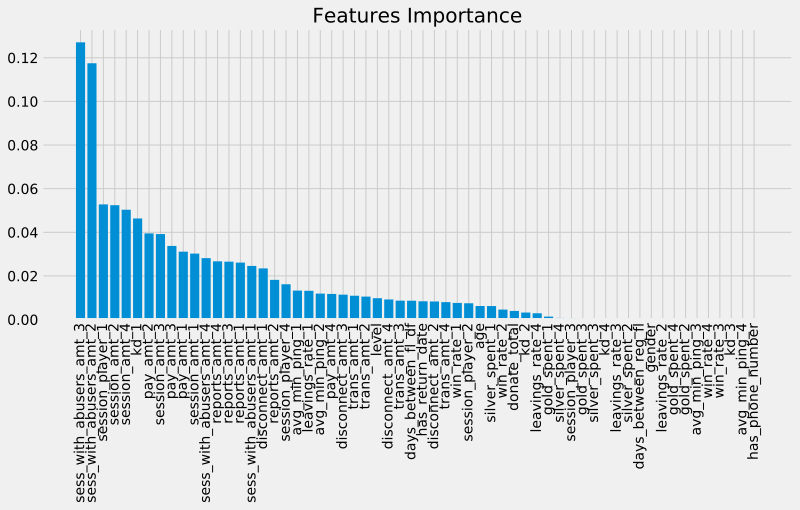

In [22]:
# %%time
fitted_clf_xgb = xgb_fit_predict(X_train_balanced, y_train_balanced, X_test, y_test)
feature_importance_fi = plot_importance(fitted_clf_xgb.feature_importances_, X.columns, 'Features Importance')

In [23]:
X_train_FI = pd.DataFrame(X_train_balanced, columns=X.columns)[feature_importance_fi[0][:30]]
X_test_FI = pd.DataFrame(X_test, columns=X.columns)[feature_importance_fi[0][:30]]

fitted_clf_xgb_fi = xgb_fit_predict(X_train_FI, y_train_balanced, X_test_FI, y_test)

print('Features before:', X_train.shape[1])
print('Features after:', X_train_FI.shape[1])

Precision: 0.2883174386920981
Recall: 0.40814850530376084
F1: 0.3379241516966068
Log Loss: 0.13285630938893125
ROC AUC: 0.8979362097226851
Features before: 60
Features after: 30


#### Chi-Square

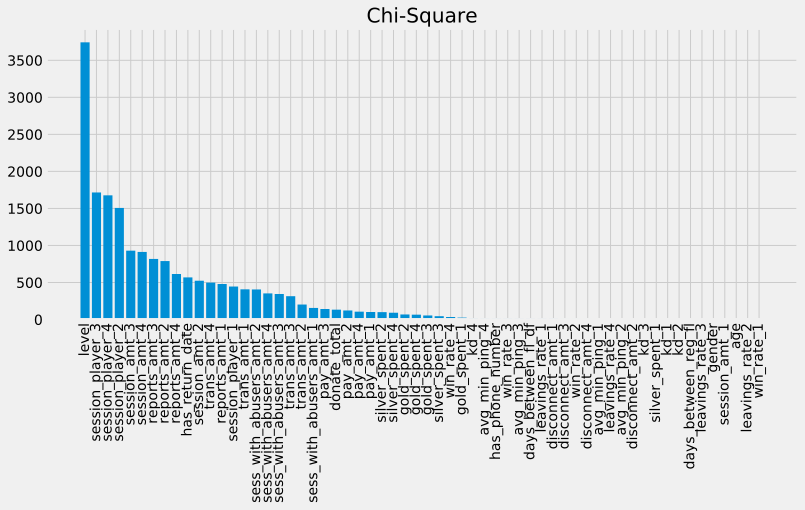

In [24]:
# %%time
chi2_test = chi2(X_train_balanced, y_train_balanced)
feature_importance_chi2 = plot_importance(chi2_test[0], X.columns, 'Chi-Square')

In [25]:
X_train_CHI = pd.DataFrame(X_train_balanced, columns=X.columns)[feature_importance_chi2[0][:30]]
X_test_CHI = pd.DataFrame(X_test, columns=X.columns)[feature_importance_chi2[0][:30]]

fitted_clf_xgb_chi = xgb_fit_predict(X_train_CHI, y_train_balanced, X_test_CHI, y_test)

Precision: 0.2827251422832273
Recall: 0.40718418514946964
F1: 0.33372851215174865
Log Loss: 0.14933152959184154
ROC AUC: 0.8232137070531594


#### RFE (Recursive Feature Elimination)

In [26]:
STEP = 5
logit = LogisticRegression(random_state=42)

selector = RFECV(estimator=logit, step=STEP, cv=StratifiedKFold(2), scoring='f1')
selector.fit(X_train_balanced, y_train_balanced)

rfe_features = X.columns[selector.support_]
print("Optimal number of features : %d" % selector.n_features_)
# len(rfe_features)

Optimal number of features : 50


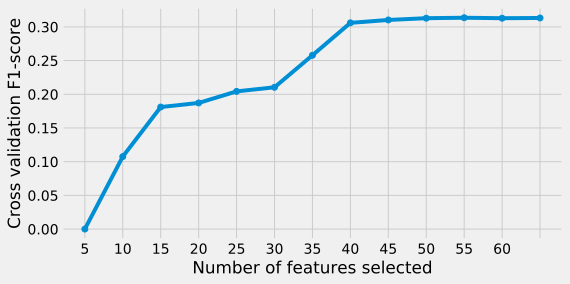

In [27]:
plt.figure(figsize=(8,4))
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_, 'o-')
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation F1-score")
plt.xticks(range(1, len(selector.grid_scores_) + 1), reversed(list(range(X_train.shape[1], 1, -STEP))))
plt.show()

In [28]:
X_train_RFE = pd.DataFrame(X_train_balanced, columns=X.columns)[rfe_features]
X_test_RFE = pd.DataFrame(X_test, columns=X.columns)[rfe_features]

fitted_clf_xgb_rfe = xgb_fit_predict(X_train_RFE, y_train_balanced, X_test_RFE, y_test)

print('Features before:', X_train.shape[1])
print('Features after:', X_train_RFE.shape[1])

Precision: 0.294820047090481
Recall: 0.4226133076181292
F1: 0.34733505052506436
Log Loss: 0.13370338667809506
ROC AUC: 0.8996398155407465
Features before: 60
Features after: 50


#### WoE (Weight of Evidence) and IV (Information Value)

In [29]:
# Using local module
from WOE_IV import data_vars

dataset_raw = pd.read_csv('../../datasets/gamechurn/dataset/dataset_raw_train.csv', sep=';')
X_raw = dataset_raw.drop(['user_id', 'is_churned'], axis=1)
y_raw = dataset_raw['is_churned']

In [30]:
# Calculate IV
iv_df, iv = data_vars(X_raw, y_raw)

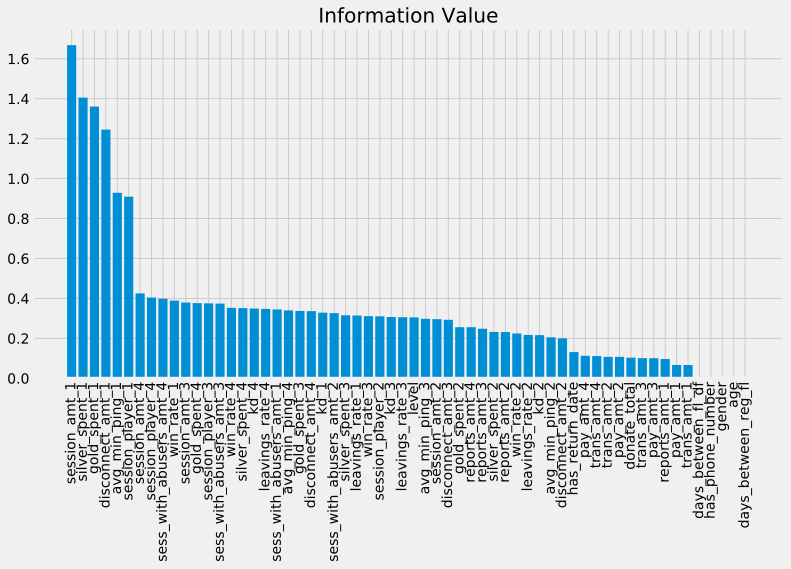

In [31]:
IV = iv.sort_values('IV', ascending=False)
plt.figure(figsize=(12,6))
plt.bar(range(IV.shape[0]), IV['IV'], align='center')
plt.xticks(range(IV.shape[0]), IV['VAR_NAME'].values, rotation=90)
plt.title('Information Value')
plt.show()

In [32]:
X_WOE = X_raw.copy()

for var in X_WOE.columns:
    small_df = iv_df.loc[iv_df['VAR_NAME'] == var]
    if type(small_df.loc[~small_df['MIN_VALUE'].isnull()]['MIN_VALUE'].values[0]) == str:
        small_df.loc[small_df['MIN_VALUE'].isnull(), 'MIN_VALUE'] = 'NaN'
        small_df.loc[small_df['MAX_VALUE'].isnull(), 'MAX_VALUE'] = 'NaN'
    else:
        small_df.loc[small_df['MIN_VALUE'].isnull(), 'MIN_VALUE'] = 0.
        small_df.loc[small_df['MAX_VALUE'].isnull(), 'MAX_VALUE'] = 0.
    transform_dict = dict(zip(small_df['MAX_VALUE'], small_df['WOE']))
    replace_cmd = ''
    replace_cmd1 = ''
    for i in sorted(transform_dict.items()):
        replace_cmd += str(i[1]) + ' if x <= ' + str(i[0]) + ' else '
        replace_cmd1 += str(i[1]) + ' if x == "' + str(i[0]) + '" else '
    replace_cmd += '0'
    replace_cmd1 += '0'
    if replace_cmd != '0':
        try:
            X_WOE[var] = X_WOE[var].apply(lambda x: eval(replace_cmd))
        except:
            X_WOE[var] = X_WOE[var].apply(lambda x: eval(replace_cmd1))

In [33]:
X_train_WOE, X_test_WOE, y_train_WOE, y_test_WOE = train_test_split(X_WOE, 
                                                                    y_raw, 
                                                                    test_size=0.3,
                                                                    shuffle=True, 
                                                                    stratify=y_raw, 
                                                                    random_state=100)
X_train_WOE_balanced, y_train_WOE_balanced = SMOTE(random_state=42, sampling_strategy=0.3).fit_sample(X_train_WOE, y_train_WOE)
print('Original dataset shape: %s' % Counter(y_train_WOE))
print('Resampled dataset shape: %s' % Counter(y_train_WOE_balanced))

Original dataset shape: Counter({0: 318955, 1: 9677})
Resampled dataset shape: Counter({0: 318955, 1: 95686})


In [34]:
# Significant features are features for which IV is not close to 0 and 1
significant_features = IV.loc[(IV['IV'] >= 0.01) & (IV['IV'] <= 0.8)]['VAR_NAME']
print('Significant features by IV:', significant_features.nunique())

Significant features by IV: 49


In [35]:
%%time
logit = LogisticRegression(random_state=42)
logit.fit(X_train_WOE_balanced, y_train_WOE_balanced)

predict_proba_test = logit.predict_proba(X_test_WOE)
predict_test = logit.predict(X_test_WOE)
precision_test, recall_test, f1_test, log_loss_test, roc_auc_test = \
    evaluation(y_test_WOE, predict_test, predict_proba_test[:, 1])

Precision: 0.2287060529177238
Recall: 0.6084860173577628
F1: 0.33245521601685984
Log Loss: 0.19276581775475612
ROC AUC: 0.8942451745985958
CPU times: user 10.2 s, sys: 135 ms, total: 10.4 s
Wall time: 9.16 s


In [36]:
%%time
logit_2 = LogisticRegression(random_state=42)
logit_2.fit(X_train_balanced, y_train_balanced)

predict_proba_test = logit_2.predict_proba(X_test)
predict_test = logit_2.predict(X_test)
precision_test, recall_test, f1_test, log_loss_test, roc_auc_test = \
    evaluation(y_test, predict_test, predict_proba_test[:, 1])

Precision: 0.2025836758661186
Recall: 0.2495178399228544
F1: 0.22361456195311655
Log Loss: 0.2551118318042279
ROC AUC: 0.7790874534572407
CPU times: user 8.41 s, sys: 117 ms, total: 8.53 s
Wall time: 7.39 s


## Random Forest

In [37]:
from sklearn.ensemble import RandomForestClassifier

In [38]:
rfc = RandomForestClassifier()

In [39]:
rfc.fit(X_train_balanced, y_train_balanced)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [40]:
predict_proba_test = rfc.predict_proba(X_test)
predict_test = rfc.predict(X_test)
precision_test, recall_test, f1_test, log_loss_test, roc_auc_test = evaluation(y_test, predict_test, predict_proba_test[:, 1])

Precision: 0.3422396856581532
Recall: 0.20998071359691417
F1: 0.2602719258927237
Log Loss: 0.2650763202484651
ROC AUC: 0.8431627985044238


## Stochastic Gradient Descent

In [41]:
from sklearn.linear_model import SGDClassifier

In [42]:
sgdc = SGDClassifier(loss="log")

In [43]:
sgdc.fit(X_train_balanced, y_train_balanced)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=1000,
              n_iter_no_change=5, n_jobs=None, penalty='l2', power_t=0.5,
              random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [44]:
predict_proba_test = sgdc.predict_proba(X_test)
predict_test = sgdc.predict(X_test)
precision_test, recall_test, f1_test, log_loss_test, roc_auc_test = evaluation(y_test, predict_test, predict_proba_test[:, 1])

Precision: 0.22079037800687284
Recall: 0.061957569913211184
F1: 0.0967620481927711
Log Loss: 0.2782293696782402
ROC AUC: 0.7565994538446759


## Model Quality

In [45]:
def plot_confusion_matrix(y_true, y_pred, classes, cmap=plt.cm.Blues):
    TN, FP, FN, TP = confusion_matrix(y_true, y_pred).ravel()
    cm = np.array([[TP, FP],
                   [FN, TN]])
    cm_normalized = cm.astype('float') / cm.sum(axis=0)
    # Plot both matrixes - basic and normalized
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,10))
    for ax, normalize, data, title in zip(ax,
                                          [False, True], 
                                          [cm, cm_normalized], 
                                          ['Confusion matrix (without normalization)', 
                                           'Сonfusion matrix (normalized)']):
        im = ax.imshow(data, interpolation='nearest', cmap=cmap)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax)
        ax.set(xticks=np.arange(data.shape[1]),
               yticks=np.arange(data.shape[0]),
               xticklabels=classes, 
               yticklabels=classes,
               title=title,
               ylabel='Predicted label',
               xlabel='True label')
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')        
        # Loop over data dimensions and create text annotations
        fmt = '.2f' if normalize else 'd'
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                ax.text(j, i, format(data[i, j], fmt), ha="center", va="center", 
                        color="white" if data[i, j] > data.max() / 2. else "black")                
    fig.tight_layout()
    return fig 

def plot_PR_curve(y_true, y_pred, y_prob):
    AP = average_precision_score(y_true=y_true, y_score=y_prob)
    precisions, recalls, thresholds = precision_recall_curve(y_true=y_true, probas_pred=y_prob)
    
    plt.step(recalls, precisions, color='b', alpha=0.2, where='post')
    plt.fill_between(recalls, precisions, alpha=0.2, color='b', step='post')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('PR curve: AP={0:0.2f}'.format(AP))
    
def plot_ROC_curve(classifier, X, y, n_folds):
    
    cv = StratifiedKFold(n_splits=n_folds)
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    i = 0
    
    for train, test in cv.split(X, y):
        probas_ = classifier.fit(X[train], y[train]).predict_proba(X[test])
        fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])
        tprs.append(interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
        i += 1
        
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    plt.plot(mean_fpr, mean_tpr, color='b', label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % \
             (mean_auc, std_auc), lw=2, alpha=.8)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2, label=r'$\pm$ 1 std. dev.')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

Precision: 0.2980166129852517
Recall: 0.42381870781099323
F1: 0.34995521051060025
Log Loss: 0.1321742773979341
ROC AUC: 0.898693972104873


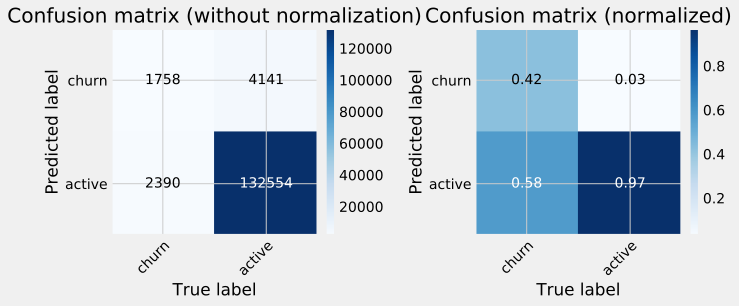

In [46]:
model = xgb_fit_predict(X_train_balanced, y_train_balanced, X_test, y_test)
predict_test = model.predict(X_test)
predict_test_probas = model.predict_proba(X_test)[:, 1]

plot_confusion_matrix(y_test.values, predict_test, classes=['churn', 'active'])
plt.show()

In [47]:
plot_PR_curve(y_test.values, predict_test, predict_test_probas)
plt.show()

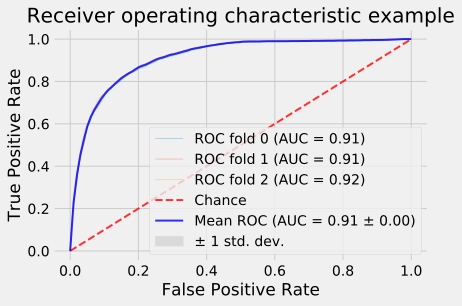

In [48]:
plot_ROC_curve(classifier=model, 
               X=X_test, 
               y=y_test.values, 
               n_folds=3)

## Saving Model

Feature selection methods used:  
* Feature Importance  
* Chi-Square
* Recursive Feature Elimination (RFE)
* WoE (Weight of Evidence) and IV (Information Value)  

Models used:  
* XGBoost  
* LogisticRegression  
* RandomForestClassifier
* SGDClassifier  

Based on ROC AUC, best model is XGBoost with a set of 45 features selected with RFE.

In [49]:
import pickle

In [50]:
# Save model to a file

with open('project-game-churn_xgb_rfe.pcl', 'wb') as f:
    pickle.dump(fitted_clf_xgb_rfe, f)

### Test Data

In [51]:
test_prepared = pd.read_csv('../../datasets/gamechurn/dataset/dataset_test.csv', sep=';')
test_prepared.head()

,user_id,level,donate_total,pay_amt_1,pay_amt_2,pay_amt_3,pay_amt_4,trans_amt_1,trans_amt_2,trans_amt_3,trans_amt_4,reports_amt_1,reports_amt_2,reports_amt_3,reports_amt_4,sess_with_abusers_amt_1,sess_with_abusers_amt_2,sess_with_abusers_amt_3,sess_with_abusers_amt_4,disconnect_amt_1,disconnect_amt_2,disconnect_amt_3,disconnect_amt_4,session_amt_1,session_amt_2,session_amt_3,session_amt_4,avg_min_ping_1,avg_min_ping_2,avg_min_ping_3,avg_min_ping_4,kd_1,kd_2,kd_3,kd_4,session_player_1,session_player_2,session_player_3,session_player_4,win_rate_1,win_rate_2,win_rate_3,win_rate_4,leavings_rate_1,leavings_rate_2,leavings_rate_3,leavings_rate_4,gold_spent_1,gold_spent_2,gold_spent_3,gold_spent_4,silver_spent_1,silver_spent_2,silver_spent_3,silver_spent_4,age,gender,days_between_reg_fl,days_between_fl_df,has_return_date,has_phone_number
0,0bda14606761d90210e6e5f7432b5a5c2f7cbda6d5144e...,13,11972.219727,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,28.000000,28.000000,28.433333,28.850000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,28.0,1.0,0,197,1,1
1,beaabc52f2f369d27d4b4132d6629e475f2117568a9041...,25,8000.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,9.800000,13.600000,11.6,10.500000,0.400000,0.000000,0.000000,0.25,0.800000,1.000000,1.200000,0.750000,48.900000,48.200000,47.750000,48.250000,1.330864,0.798504,0.891152,0.785114,9189.800000,9535.600000,9609.600000,6696.0,0.510345,0.190794,0.320776,0.158459,0.046667,0.054720,0.056818,0.043155,0.000000,0.000000,0.000000,0.000000,3020.000000,660.000000,2560.000000,0.0,39.0,1.0,0,999,1,1
2,969daefac09c760c75e0a131d4397ef43278151ead9232...,12,5408.120117,500.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.333333,0.0,0.0,0.0,7.833333,0.000000,0.0,0.000000,1.666667,0.000000,0.000000,0.00,0.333333,0.000000,0.000000,0.000000,39.823809,28.000000,28.433333,28.850000,1.735377,0.000000,0.000000,0.000000,8396.000000,0.000000,0.000000,0.0,1.034341,0.000000,0.000000,0.000000,0.073793,0.000000,0.000000,0.000000,4.666667,0.000000,0.000000,0.000000,17663.333333,0.000000,0.000000,0.0,17.0,1.0,0,22,1,1
3,2f8a302052389f20fbe09e144c60917e5495312f7a83bc...,49,121067.437500,450.0,600.0,0.0,0.0,1.0,1.0,0.0,0.0,0.000000,0.0,0.0,1.0,9.285714,7.250000,5.0,4.500000,0.428571,0.250000,0.000000,0.00,2.714286,1.250000,1.400000,1.000000,67.032653,70.100001,66.800000,67.666667,1.253624,1.102322,1.041380,1.131620,10072.142857,6625.250000,5570.166667,3699.0,1.059664,0.640909,1.398942,0.587500,0.022421,0.000000,0.000000,0.000000,1.428571,155.000000,0.000000,0.000000,7428.571429,110250.000000,10000.000000,6000.0,23.0,0.0,0,131,1,1
4,10bf851621a8a69b0900f3b5f3c0904a45f2b952e6e2d4...,11,4194.000000,392.0,541.0,0.0,342.0,1.0,2.0,0.0,1.0,1.600000,1.5,1.0,1.5,4.857143,4.571429,4.0,5.571429,0.142857,0.571429,0.142857,0.50,1.571429,1.714286,1.428571,2.333333,61.714286,70.047619,64.142857,63.000000,3.705697,2.225859,2.329060,2.932253,6412.714286,6202.571429,4811.571429,6247.0,1.303061,1.338899,1.164286,0.822449,0.087524,0.021978,0.000000,0.048980,0.000000,168.571429,25.714286,101.714286,6000.000000,17792.857143,19857.142857,0.0,11.0,1.0,0,0,1,1


In [52]:
test_prepared.shape

(44764, 61)

In [65]:
test_final = test_prepared[['user_id']]

In [67]:
X_test = test_prepared.drop(['user_id'], axis=1)

In [68]:
X_test_mm = scaler.transform(X_test)

In [69]:
test_final['is_churned'] = model.predict(X_test_mm)

### Predictions

In [71]:
predictions_xgb = test_final.loc[:, ['user_id', 'is_churned']]
predictions_xgb

,user_id,is_churned
0,0bda14606761d90210e6e5f7432b5a5c2f7cbda6d5144e...,0
1,beaabc52f2f369d27d4b4132d6629e475f2117568a9041...,0
2,969daefac09c760c75e0a131d4397ef43278151ead9232...,0
3,2f8a302052389f20fbe09e144c60917e5495312f7a83bc...,0
4,10bf851621a8a69b0900f3b5f3c0904a45f2b952e6e2d4...,0
...,...,...
44759,0d191c1f3201c942f756d9606dccd6e09f5de3aec39bc5...,0
44760,2ffd16471ccf01091e720859f52f4dd54e59a008ce6b05...,0
44761,fdf340c2f0376f6a382e68f79b619f87263c34d2621600...,0
44762,455e87f959ba40caca6d27e8612fc712f25bf7948906a1...,0


In [72]:
predictions_xgb['is_churned'].value_counts()

0    44662
1      102
Name: is_churned, dtype: int64

In [73]:
predictions_xgb.to_csv('../../datasets/gamechurn/dataset/predictions_xgb.csv', index=None)